# Raster Data Processing Using Python

# Raster Data

Raster data represent objects/variables on the Earth's surface as a matrix of values, in the form of pixels, cells, or grids

<B>Layers and bands</B>

A raster is an image with a matrix of values representing the values of some observed attribute. Bands of a raster correspond to different variables, usually using the same matrix structure.

Example: Spatial variability of temperature, elevation, rainfall, etc. over a region.

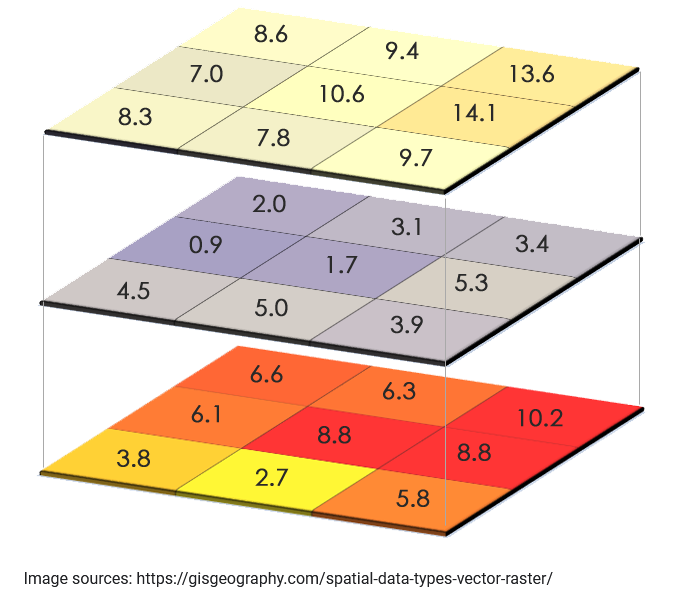

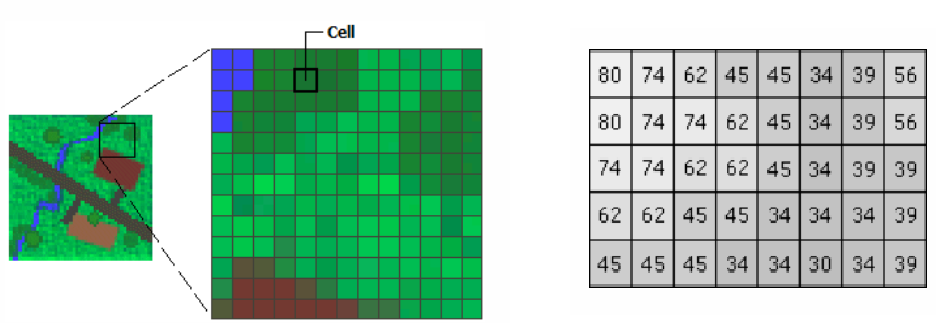

# Raster Bands

Some rasters have a single band, of data, while others have multiple bands. Basically, a band is represented by a single matrix of cell values, and a raster with multiple bands contains multiple spatially coincident matrices of cell values representing the same spatial area. An example of a single-band raster dataset is a digital elevation model (DEM). Each cell in a DEM contains only one value representing surface elevation.

# Single band raster

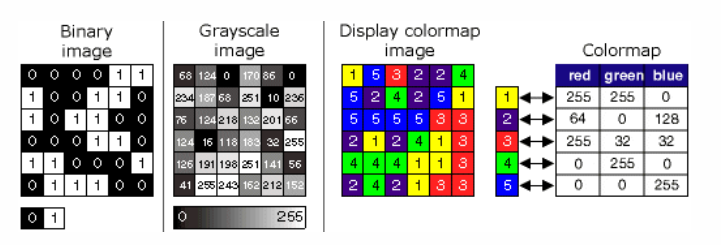

# Multi band Raster

A satellite image, for example, commonly has multiple bands representing different wavelengths from the ultraviolet through the visible and infrared portions of the electromagnetic spectrum

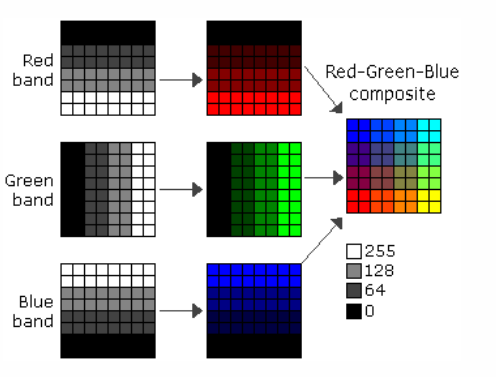

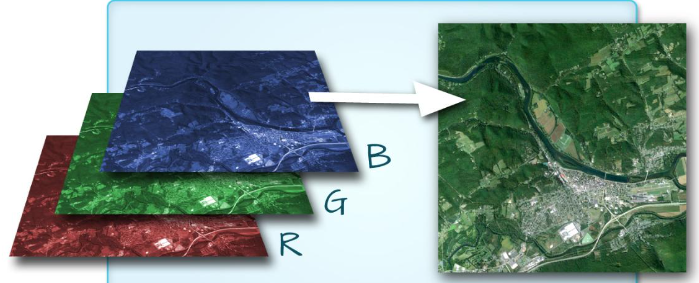

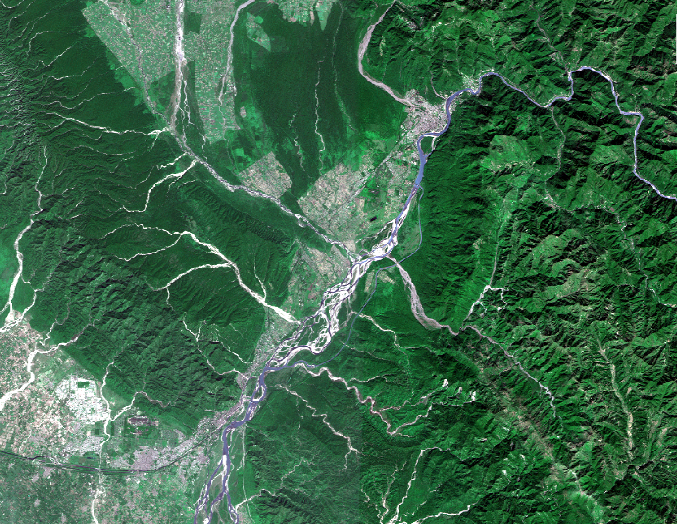

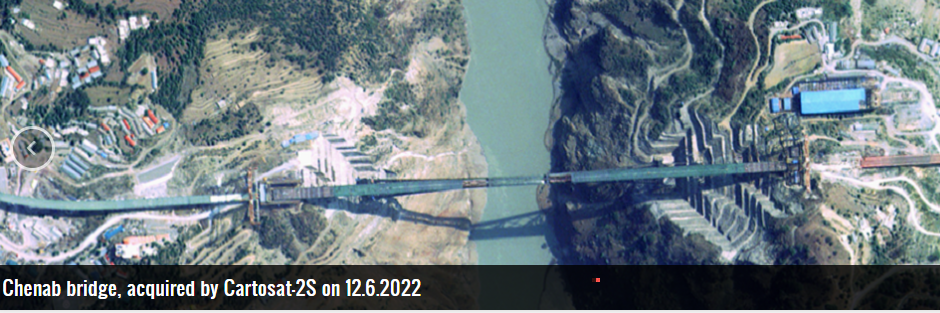

Image Credits 
<UL>
<LI>Google Earth Engine https://earthengine.google.com/
<LI>ARC GIS https://pro.arcgis.com/
Geoprocessing with Python By Chris Garrad https://www.manning.com/books/geoprocessing-with-python

# Introduction to GDAL

The Geospatial Data Abstraction Library (GDAL) is a translator library for raster and vector geospatial data formats <br />
GDAL is a computer software library for reading and writing raster and vector geospatial data format.<br />
GDAL presents a single raster abstract data model and single vector abstract data model to the calling application for all supported formats.<br />
GDAL also comes with a variety of useful command line utilities for data translation and processing<br />


# Advantages of GDAL

<ul>
<li>Free and Open Source (https://github.com/OSGeo/gdal).</li>
<li>Support for over 80+ Image formats and map projections.</li>
<li>Command line as well as C/C++/Python/R/Java API.</li>
<li>Used extensively by worlds large geospatial data services.</li>
<li>Extensive test suite and active developer community.</li>
<li>GDAL also includes extensive support for vector datasets</li>
</ul>

# GDAL Raster Data Model
<ul>
<li>A dataset (represented by the  `GDALDataset` class) is an assembly of related raster bands and some information common to them all
<li>A dataset has a concept of the raster size (in pixels and lines)
<li>A dataset is also responsible for the georeferencing transform and coordinate system definition of all bands
<li>A dataset itself can also have associated metadata, a list of name/value pairs in string form.

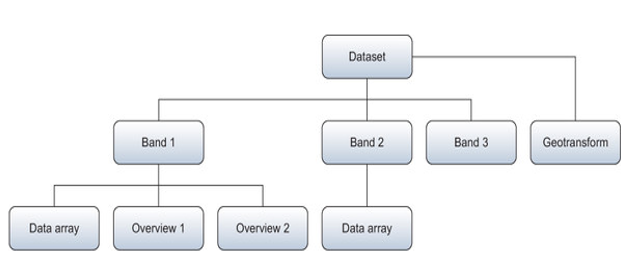

# Map Projection

A map projection is a way to flatten a earths's surface into a plane in order to make a map. This requires a systematic transformation of the latitudes and longitudes of locations from the surface of the globe into locations on a plane. All projections of a sphere on a plane necessarily distort the surface in some way and to some extent

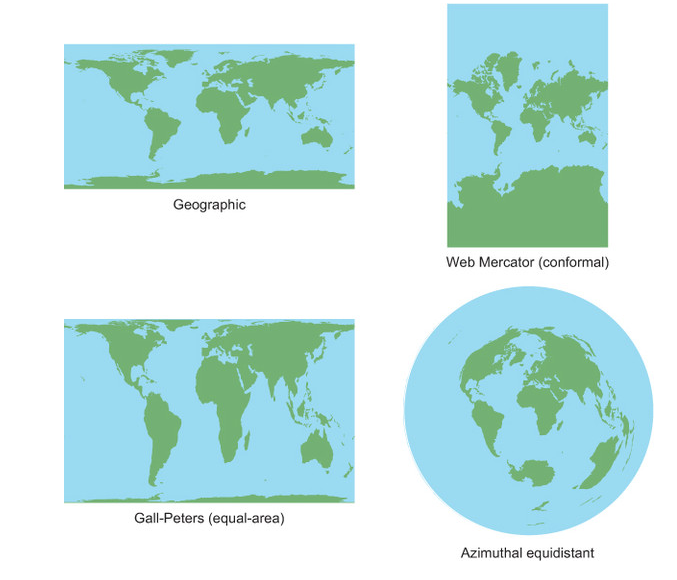

# Coordinate System

There are numerous conventions used globally for representing the coordinate system for map data


Dataset coordinate systems are represented as OpenGIS Well Known Text strings. This can contain
<li>An overall coordinate system name.
<li>A geographic coordinate system name.
<li>A datum identifier.
<li>An ellipsoid name, semi-major axis, and inverse flattening.
<li>A prime meridian name and offset from Greenwich.
<li>A projection method type (i.e. Transverse Mercator).
<li>A list of projection parameters (i.e. central_meridian).
<li>A units name, and conversion factor to meters or radians.
<li>Names and ordering for the axes.
<li>Codes for most of the above in terms of predefined coordinate systems from authorities such as EPSG.

<ol>
<li>PROJ4 - https://proj4.org/usage/projections.html
<li>OGC WKT (defacto standard) - http://docs.opengeospatial.org/is/12-063r5/12-063r5.html
<li>EPSG codes (Easy to use) - http://spatialreference.org/ref/epsg/
<li>XML etc
</ol>


# Coordinate of Image

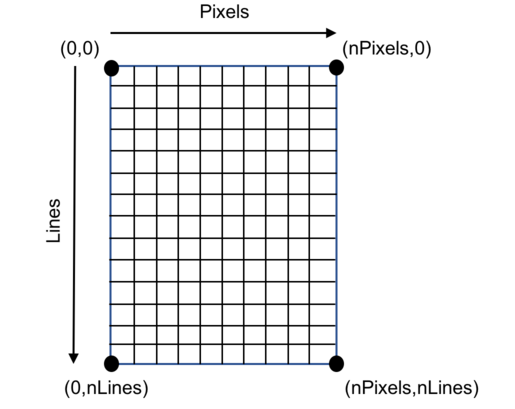

# Pixel Line to Real Coordinate

A geotransform is an affine transformation from the image coordinate space (row, column), also known as (pixel, line) to the georeferenced coordinate space (projected or geographic coordinates)

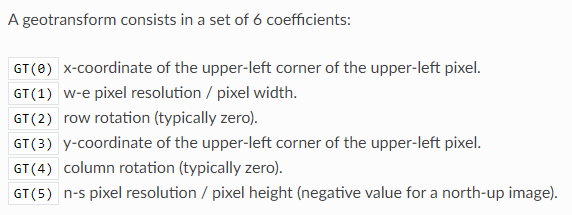

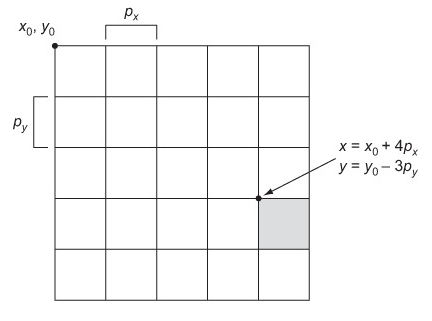

## Transformation from image coordinate space to georeferenced coordinate space

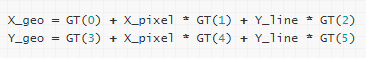

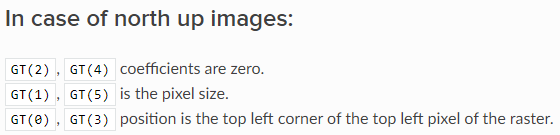

In [1]:
import os
os.chdir(r'D:\WgCAPD\data\Haridwar')

In [2]:
!gdalinfo -nomd haridwar.tif

Driver: GTiff/GeoTIFF
Files: haridwar.tif
       haridwar.tif.ovr
Size is 1151, 1151
Coordinate System is:
GEOGCRS["WGS 84",
    DATUM["World Geodetic System 1984",
        ELLIPSOID["WGS 84",6378137,298.257223563,
            LENGTHUNIT["metre",1]]],
    PRIMEM["Greenwich",0,
        ANGLEUNIT["degree",0.0174532925199433]],
    CS[ellipsoidal,2],
        AXIS["geodetic latitude (Lat)",north,
            ORDER[1],
            ANGLEUNIT["degree",0.0174532925199433]],
        AXIS["geodetic longitude (Lon)",east,
            ORDER[2],
            ANGLEUNIT["degree",0.0174532925199433]],
    ID["EPSG",4326]]
Data axis to CRS axis mapping: 2,1
Origin = (77.995500000000007,30.004500000000000)
Pixel Size = (0.000225021720243,-0.000225021720243)
Corner Coordinates:
Upper Left  (  77.9955000,  30.0045000) ( 77d59'43.80"E, 30d 0'16.20"N)
Lower Left  (  77.9955000,  29.7455000) ( 77d59'43.80"E, 29d44'43.80"N)
Upper Right (  78.2545000,  30.0045000) ( 78d15'16.20"E, 30d 0'16.20"N)
Lower Right (  

# Getting Raster Information with Python

In [6]:
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np
#from pathlib import Path
import os
from osgeo import osr
import math

In [7]:
file_name = 'haridwar.tif'

In [8]:
ds = gdal.Open(file_name)
ds

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x0000022A4A408390> >

In [9]:
print('File list:', ds.GetFileList())

File list: ['haridwar.tif', 'haridwar.tif.ovr']


In [10]:
print('Width:', ds.RasterXSize)

Width: 1151


In [11]:
print('Height:', ds.RasterYSize)

Height: 1151


In [12]:
print('Coordinate system:', ds.GetProjection())

Coordinate system: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]


In [13]:
gt = ds.GetGeoTransform()
gt

(77.9955, 0.00022502172024325468, 0.0, 30.0045, 0.0, -0.00022502172024326702)

In [14]:
print('Origin:', (gt[0], gt[3]))
print('Pixel size:', (gt[1], gt[5]))

Origin: (77.9955, 30.0045)
Pixel size: (0.00022502172024325468, -0.00022502172024326702)


In [15]:
print('Upper Left Corner:', gdal.ApplyGeoTransform(gt,0,0))
print('Upper Right Corner:', gdal.ApplyGeoTransform(gt,ds.RasterXSize,0))
print('Lower Left Corner:', gdal.ApplyGeoTransform(gt,0,ds.RasterYSize))
print('Lower Right Corner:',gdal.ApplyGeoTransform(gt,ds.RasterXSize,ds.RasterYSize))
print('Center:', gdal.ApplyGeoTransform(gt,ds.RasterXSize/2,ds.RasterYSize/2))

Upper Left Corner: [77.9955, 30.0045]
Upper Right Corner: [78.2545, 30.0045]
Lower Left Corner: [77.9955, 29.7455]
Lower Right Corner: [78.2545, 29.7455]
Center: [78.125, 29.875]


In [16]:
print('Metadata:', ds.GetMetadata())

Metadata: {'AREA_OR_POINT': 'Area'}


In [18]:
print('Number of bands:', ds.RasterCount)

Number of bands: 4


In [19]:
for i in range(1, ds.RasterCount+1):
    band = ds.GetRasterBand(i) # in GDAL, band are indexed starting at 1!
    interp = band.GetColorInterpretation()
    interp_name = gdal.GetColorInterpretationName(interp)
    (w,h)=band.GetBlockSize()
    print('Band {0:d}, block size {1:d} {2:d}, color interp {3:s}'.format(i,w,h,interp_name))
    ovr_count = band.GetOverviewCount()
    for j in range(ovr_count):
        ovr_band = band.GetOverview(j) # but overview bands starting at 0
        print(' Overview %d: %dx%d'%(j, ovr_band.XSize, ovr_band.YSize))

Band 1, block size 1151 1, color interp Gray
 Overview 0: 576x576
 Overview 1: 288x288
 Overview 2: 144x144
Band 2, block size 1151 1, color interp Undefined
 Overview 0: 576x576
 Overview 1: 288x288
 Overview 2: 144x144
Band 3, block size 1151 1, color interp Undefined
 Overview 0: 576x576
 Overview 1: 288x288
 Overview 2: 144x144
Band 4, block size 1151 1, color interp Undefined
 Overview 0: 576x576
 Overview 1: 288x288
 Overview 2: 144x144


In [ ]:
del ds

In [20]:
info = gdal.Info(file_name, format='json')

In [21]:
pprint.pprint(info)

{'bands': [{'band': 1,
            'block': [1151, 1],
            'colorInterpretation': 'Gray',
            'metadata': {},
            'overviews': [{'size': [576, 576]},
                          {'size': [288, 288]},
                          {'size': [144, 144]}],
            'type': 'UInt16'},
           {'band': 2,
            'block': [1151, 1],
            'colorInterpretation': 'Undefined',
            'metadata': {},
            'overviews': [{'size': [576, 576]},
                          {'size': [288, 288]},
                          {'size': [144, 144]}],
            'type': 'UInt16'},
           {'band': 3,
            'block': [1151, 1],
            'colorInterpretation': 'Undefined',
            'metadata': {},
            'overviews': [{'size': [576, 576]},
                          {'size': [288, 288]},
                          {'size': [144, 144]}],
            'type': 'UInt16'},
           {'band': 4,
            'block': [1151, 1],
            'colorInterpretat

In [22]:
ds = gdal.Open(file_name)

In [23]:
for i in range(1,ds.RasterCount+1):
    band = ds.GetRasterBand(i)
    (minimum, maximum, mean, stddev) = band.ComputeStatistics(False)
    print('Band{:d}, min={:.3f}, max={:.3f},mean={:.3f},stddev={:.3f}'.format(i, minimum, maximum, mean, stddev))

Band1, min=82.000, max=315.000,mean=116.609,stddev=21.027
Band2, min=58.000, max=381.000,mean=106.402,stddev=29.266
Band3, min=85.000, max=497.000,mean=198.809,stddev=24.025
Band4, min=54.000, max=675.000,mean=181.569,stddev=31.315


In [24]:
band = ds.GetRasterBand(1)


In [25]:
data = band.ReadAsArray()

In [26]:
data

array([[121, 124, 128, ...,  99,  97,  98],
       [118, 114, 125, ..., 102,  98,  98],
       [114, 119, 130, ..., 113, 109, 105],
       ...,
       [129, 132, 133, ...,  96,  96,  98],
       [129, 134, 131, ...,  94,  95,  98],
       [133, 132, 128, ...,  96,  95,  96]], dtype=uint16)

In [27]:
#data[data>100]=255

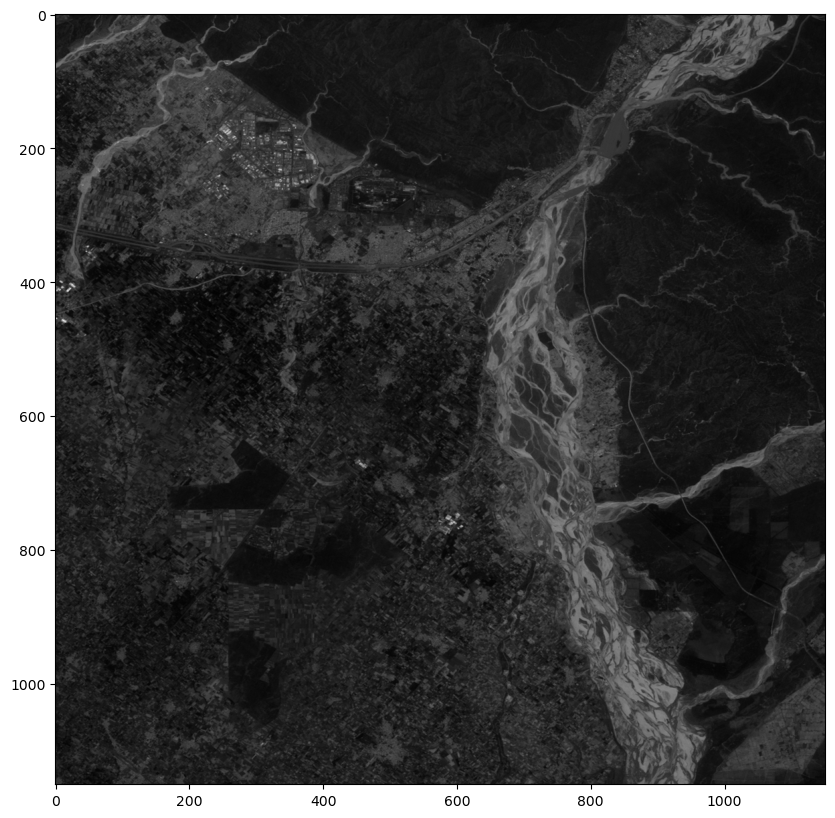

In [28]:
plt.figure(figsize=(10,10))
plt.imshow(data,cmap='gray')


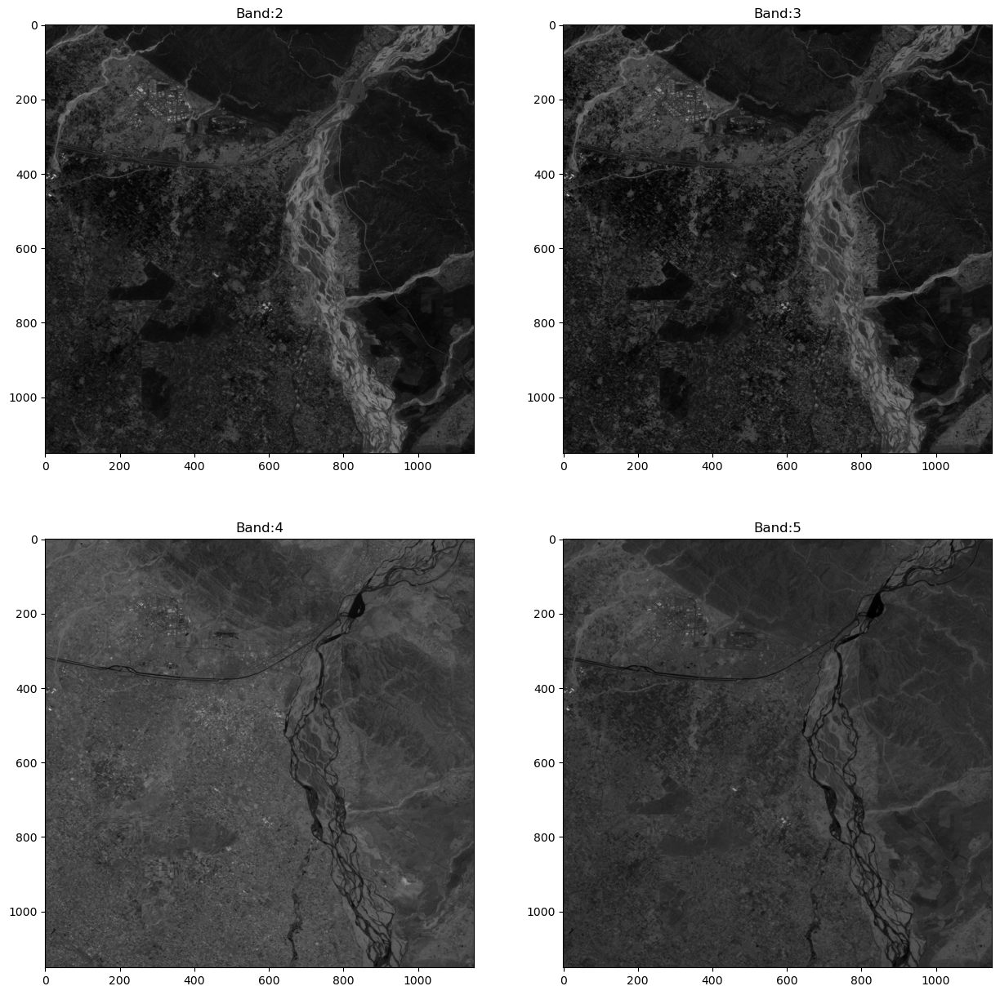

In [29]:
plt.figure(figsize=(15,15))
for i in range(1,ds.RasterCount+1):
    band = ds.GetRasterBand(i)
    plt.subplot(2,2,i)
    plt.title('Band:'+str(i+1))
    plt.imshow(band.ReadAsArray(),cmap='gray')

In [30]:
plt.close()

#  Visualise MultiBand Raster
Though there are many possible combinations of wavelength bands, the Earth Observatory typically selects  combinations based on the event or feature we want to illustrate.</br> 
For instance, floods are best viewed in shortwave infrared, near infrared, and green light because muddy water blends with brown land in a natural color image.</br> Shortwave infrared light highlights the difference between clouds, ice, and snow, all of which are white in visible light.

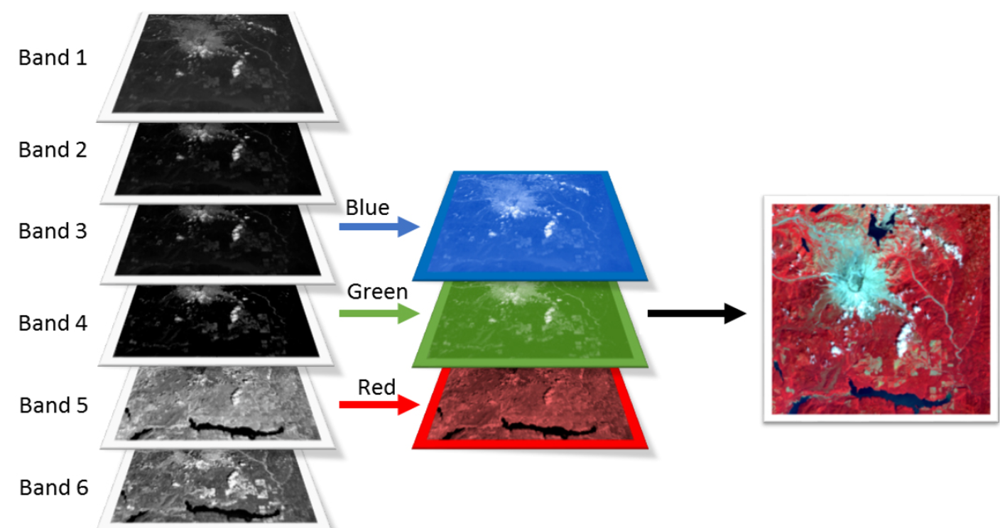

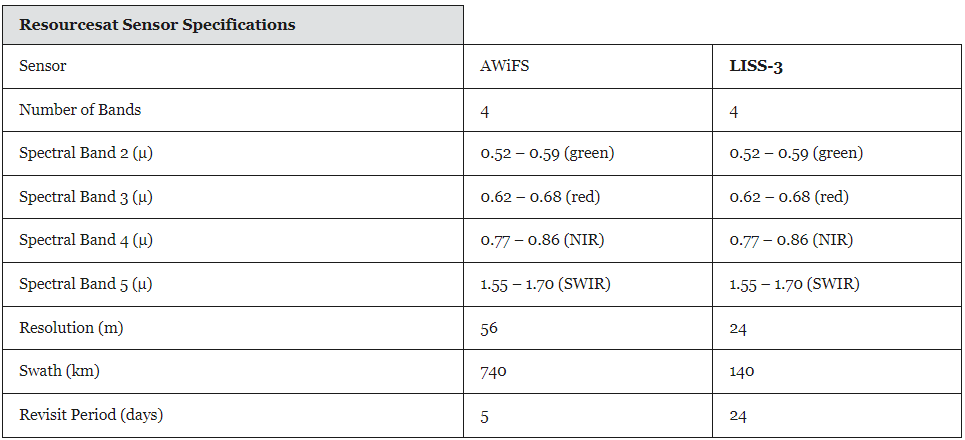

##  False Color Composite
<ol>
<li>Near infrared (red), green (blue), red (green). This is a traditional band combination useful in seeing changes in plant health.
<li>Shortwave infrared (red), near infrared (green), and green (blue), often used to show floods or newly burned land.
<li>Blue (red), two different shortwave infrared bands (green and blue). We use this to differentiate between snow, ice, and clouds.
<li>Thermal infrared, usually shown in tones of gray to illustrate temperature.
</ol>

## Standard False Color Composites

Near infrared (red), red (green),  green (blue)<br>


In [31]:
multi_data = ds.ReadAsArray(band_list=[3, 2, 1])

In [32]:
multi_data.shape

(3, 1151, 1151)

In [33]:
multi_data = np.transpose(multi_data, axes=(1, 2, 0))

In [34]:
multi_data.shape

(1151, 1151, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


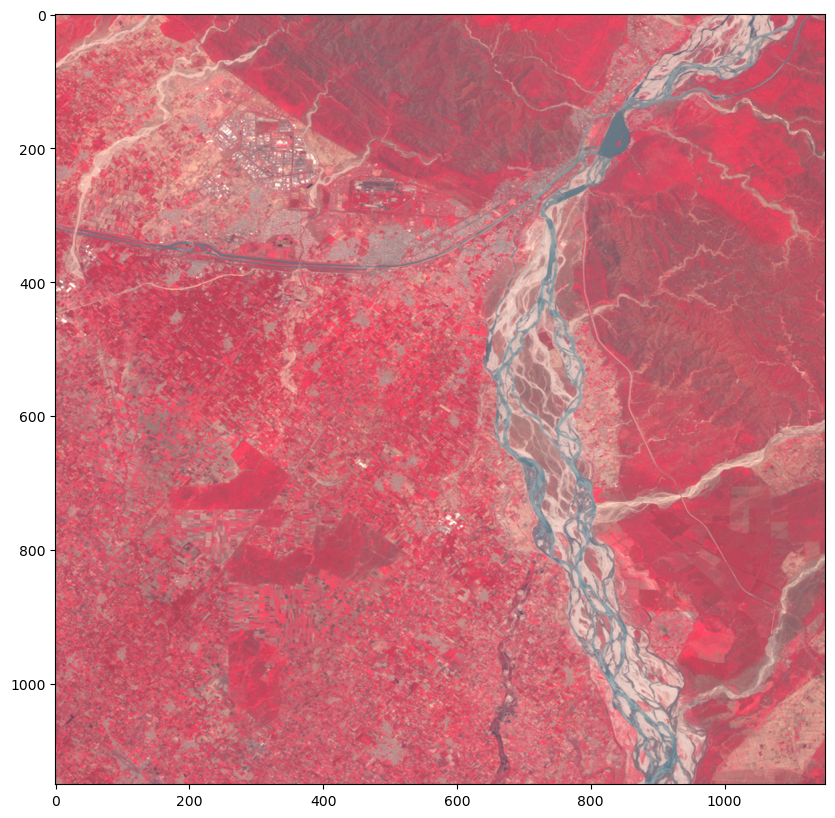

In [35]:
plt.figure(figsize=(10,10))
plt.imshow(multi_data)

In this case, plants reflect near infrared and green light, while absorbing red. Since they reflect more near infrared than green, plant-covered land appears deep red.<br>
Cities and exposed ground are gray or tan, and clear water is black. This band combination is valuable for gauging plant health.

In [36]:
plt.close()

##  False Color Composites

Shortwave infrared (red), near infrared (green), and green (blue)

In [37]:
multi_data = ds.ReadAsArray(band_list=[4, 3, 1])

In [38]:
multi_data = np.transpose(multi_data, axes=(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


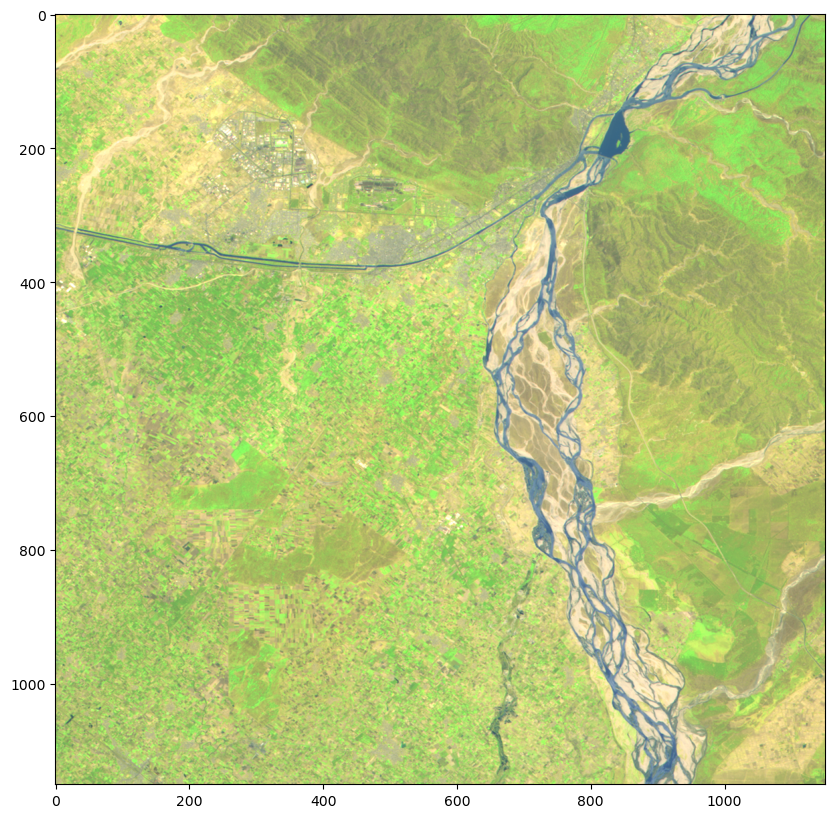

In [39]:
plt.figure(figsize=(10,10))
plt.imshow(multi_data)

In [40]:
multi_data = ds.ReadAsArray(band_list=[2, 3, 1])

In [41]:
multi_data = np.transpose(multi_data, axes=(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


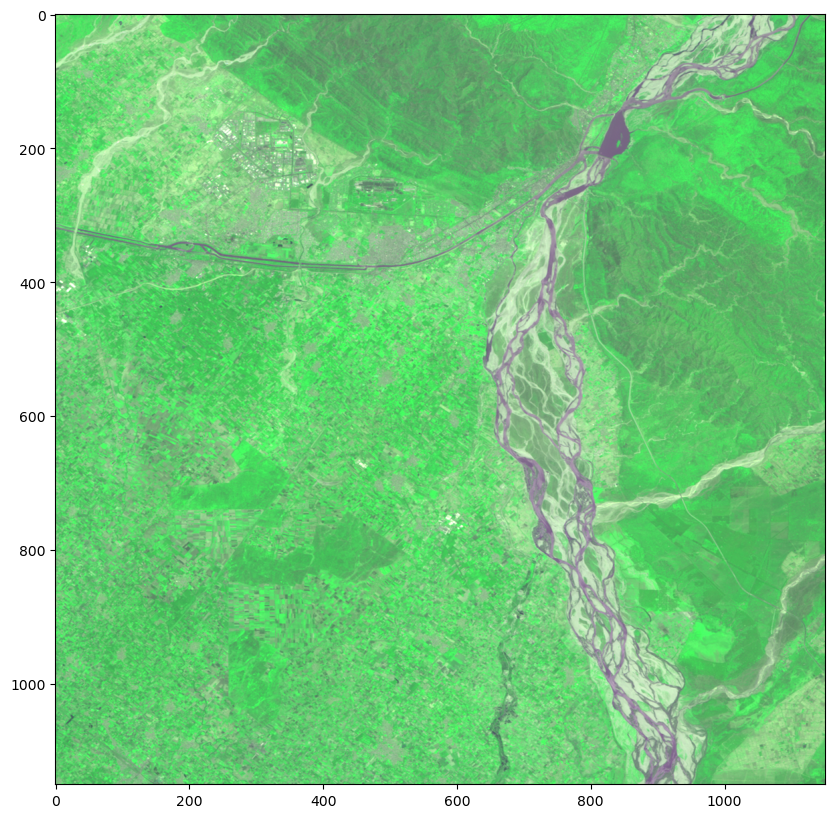

In [42]:
plt.figure(figsize=(10,10))
plt.imshow(multi_data)

In [43]:
plt.close()

# Reading Partial Data set

In [44]:
band = ds.GetRasterBand(1)

In [45]:
data=band.ReadAsArray(xoff=600, yoff=600,win_xsize=512,win_ysize=512)

In [46]:
data.shape

(512, 512)

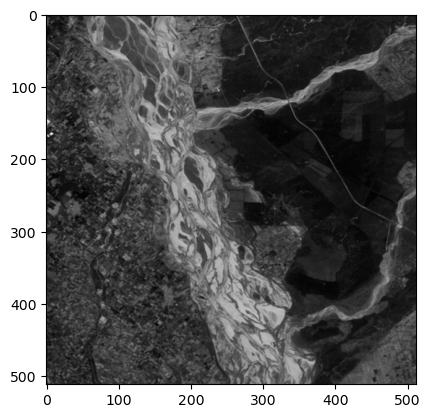

In [47]:
plt.imshow(data,cmap='gray')

In [48]:
del data
del ds

# Writing Raster Data

# Writing a Single Band Raster CreateCopy Method

There are two general techniques for creating files, using CreateCopy() and Create().
The CreateCopy method involves calling the CreateCopy() method on the format driver, and passing in a source dataset that should be copied. The Create method involves calling the Create() method on the driver, and then explicitly writing all the metadata, and raster data with separate calls.
https://gdal.org/drivers/raster/index.html

In [49]:
fileformat = "GTiff"

In [50]:
driver = gdal.GetDriverByName(fileformat)

In [51]:
print(driver.ShortName)

GTiff


In [52]:
print(driver.LongName)

GeoTIFF


In [53]:
metadata = driver.GetMetadata()

In [54]:
metadata

{'DCAP_COORDINATE_EPOCH': 'YES',
 'DCAP_CREATE': 'YES',
 'DCAP_CREATECOPY': 'YES',
 'DCAP_OPEN': 'YES',
 'DCAP_RASTER': 'YES',
 'DCAP_VIRTUALIO': 'YES',
 'DMD_CREATIONDATATYPES': 'Byte UInt16 Int16 UInt32 Int32 Float32 Float64 CInt16 CInt32 CFloat32 CFloat64',
 'DMD_CREATIONOPTIONLIST': "<CreationOptionList>   <Option name='COMPRESS' type='string-select'>       <Value>NONE</Value>       <Value>LZW</Value>       <Value>PACKBITS</Value>       <Value>JPEG</Value>       <Value>CCITTRLE</Value>       <Value>CCITTFAX3</Value>       <Value>CCITTFAX4</Value>       <Value>DEFLATE</Value>       <Value>ZSTD</Value>       <Value>LERC</Value>       <Value>LERC_DEFLATE</Value>       <Value>LERC_ZSTD</Value>   </Option>   <Option name='PREDICTOR' type='int' description='Predictor Type (1=default, 2=horizontal differencing, 3=floating point prediction)'/>   <Option name='DISCARD_LSB' type='string' description='Number of least-significant bits to set to clear as a single value or comma-separated list o

# Using CreateCopy()

The `GDALDriver::CreateCopy()` method is fairly simply as most information is collected from the source dataset.

In [56]:
src_file = 'L3-NH44M01-096-050-06Jun14-BAND4.tif'

In [57]:
dst_filename = 'op_raster1.tif'


In [58]:
src_ds = gdal.Open(src_file)

In [59]:
driver = gdal.GetDriverByName('GTiff')

In [60]:
dst_ds = driver.CreateCopy(dst_filename, src_ds)

In [61]:
data = src_ds.ReadAsArray()

In [62]:
inv_data = np.invert(data)

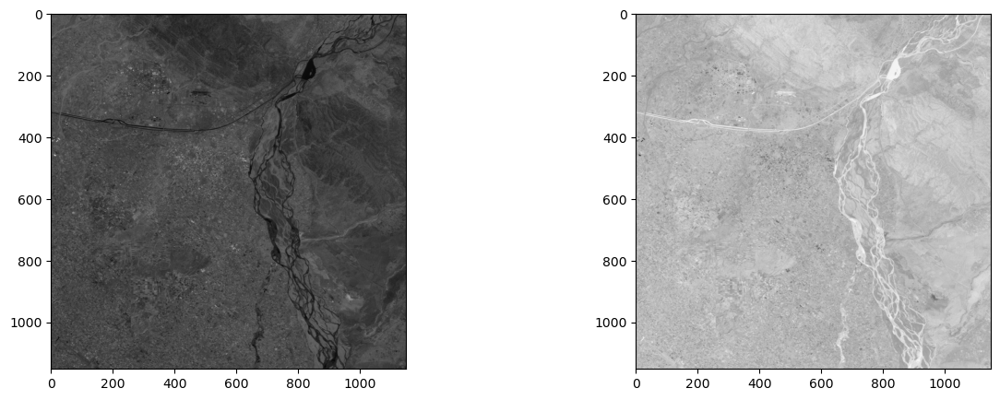

In [63]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.imshow(data, cmap='gray')

plt.subplot(1,2,2)
plt.imshow(inv_data, cmap='gray')


In [65]:
out_band = dst_ds.GetRasterBand(1)

In [66]:
out_band.WriteArray(inv_data)

0

In [67]:
out_band.FlushCache()

In [68]:
del dst_ds

In [69]:
ds = gdal.Open(dst_filename)

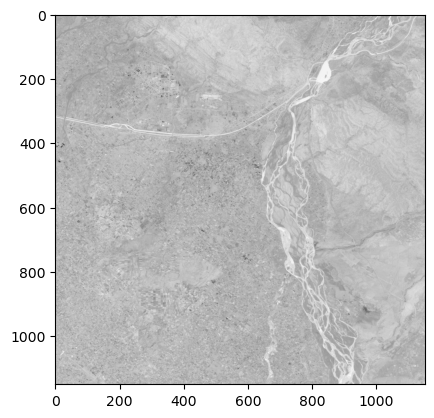

In [70]:
plt.imshow(ds.ReadAsArray(), cmap='gray')

# Writing a Single Band Raster Create Method

For situations in which we are not just exporting an existing file to a new file, it is generally necessary to use the `GDALDriver::Create()` method.To  The Create() method  image size, number of bands and band type must be provided explicitly.

<ol>
<li>A csv file containing daily Gridded Rainfall Data Set Over India. 
<li> The first data in the record is at 6.5N & 66.5E, the second is at 6.5N & 66.75E, and so on
<li> The second row 6.75N & 66.5E, the second is at 6.75N & 66.75E,
<li> The last data record corresponds to 38.5N & 100.0E
<li>Latitude: 6.5N 38.5N  .25
<li>Longitude: 66.5E  100.0E   .25
<li>Rows and Column: 129x135
   <ol>

In [71]:
src_txt_file = 'rainfall.txt'

In [72]:
dst_filename= 'op_raster2.tif'

In [73]:
driver = gdal.GetDriverByName('GTiff')

In [74]:
dst_ds = driver.Create(dst_filename,xsize=135,ysize=129,bands=1,
                      eType=gdal.GDT_Int16)

In [75]:
data = np.loadtxt(src_txt_file,delimiter=',',dtype=np.float32)

In [76]:
data

array([[-999., -999., -999., ..., -999., -999., -999.],
       [-999., -999., -999., ..., -999., -999., -999.],
       [-999., -999., -999., ..., -999., -999., -999.],
       ...,
       [-999., -999., -999., ..., -999., -999., -999.],
       [-999., -999., -999., ..., -999., -999., -999.],
       [-999., -999., -999., ..., -999., -999., -999.]], dtype=float32)

In [77]:
band = dst_ds.GetRasterBand(1)

# Adding Metadata with band

In [78]:
from datetime import datetime

In [79]:
band_meta = {'Date of Creation': str(datetime.now()), 'scale_factor':'1'}

In [80]:
band.SetMetadata(band_meta)

0

#  Adding NoData with band

In [81]:
band.SetNoDataValue(-999)

0

In [82]:
band.WriteArray(data)

0

# Adding Metadata to dataset

In [83]:
ds_meta = {'Date of Creation': str(datetime.now()), 'organisation':'1', 'Processng Level':'L3'}

In [84]:
dst_ds.SetMetadata(ds_meta)

0

In [85]:
dst_ds.FlushCache()
dst_ds=None

In [86]:
ds = gdal.Open(dst_filename)

In [87]:
ds.GetMetadata()

{'Date of Creation': '2023-07-06 17:00:19.471131',
 'organisation': '1',
 'Processng Level': 'L3'}

In [88]:
ds.GetRasterBand(1).GetMetadata()

{'Date of Creation': '2023-07-06 17:00:16.590382', 'scale_factor': '1'}

In [89]:
ds.GetRasterBand(1).GetNoDataValue()

-999.0

In [90]:
import numpy.ma as ma

In [91]:
data = ds.ReadAsArray()
data = ma.masked_equal(data, -999)

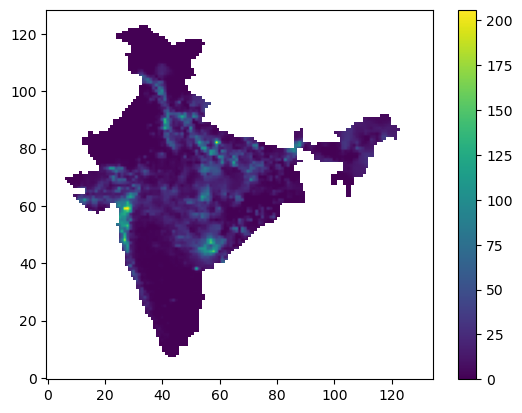

In [92]:
plt.imshow(data, origin='lower')
plt.colorbar()

In [93]:
ds = None

# Writing a Georefenced Raster

In [94]:
from osgeo import osr

In [95]:
crs=osr.SpatialReference()

In [96]:
crs.SetWellKnownGeogCS('WGS84')

0

In [97]:
crs.ExportToWkt()

'GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'

In [98]:
trf=[66.5, .25, 0.0, 6.5 , 0.0, .25]

In [99]:
src_txt_file='rainfall.txt'
dst_filename='op_raster2.img'

In [100]:
driver=gdal.GetDriverByName('HFA')

In [101]:
dst_ds = driver.Create(dst_filename,xsize=135,ysize=129,bands=1,
                      eType=gdal.GDT_Int16)

In [102]:
dst_ds.SetProjection(crs.ExportToWkt())

0

In [103]:
dst_ds.SetGeoTransform(trf)

0

In [104]:
band=dst_ds.GetRasterBand(1)

In [105]:
band.SetNoDataValue(-999)

0

In [106]:
data = np.loadtxt(src_txt_file,delimiter=',',dtype=np.int16)

C:\Users\ravib\AppData\Local\Temp\ipykernel_16320\3885190559.py:1: DeprecationWarning: loadtxt(): Parsing an integer via a float is deprecated.  To avoid this warning, you can:
    * make sure the original data is stored as integers.
    * use the `converters=` keyword argument.  If you only use
      NumPy 1.23 or later, `converters=float` will normally work.
    * Use `np.loadtxt(...).astype(np.int64)` parsing the file as
      floating point and then convert it.  (On all NumPy versions.)
  (Deprecated NumPy 1.23)
  data = np.loadtxt(src_txt_file,delimiter=',',dtype=np.int16)


In [107]:
band.WriteArray(data)

0

In [108]:
dst_ds.FlushCache()
dst_ds=None

# Read and confirm

In [109]:
ds = gdal.Open(dst_filename)

In [110]:
ds.GetProjection()

'GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'

In [111]:
ds.GetGeoTransform()

(66.5, 0.25, 0.0, 6.5, 0.0, 0.25)

In [112]:
data = ds.ReadAsArray()

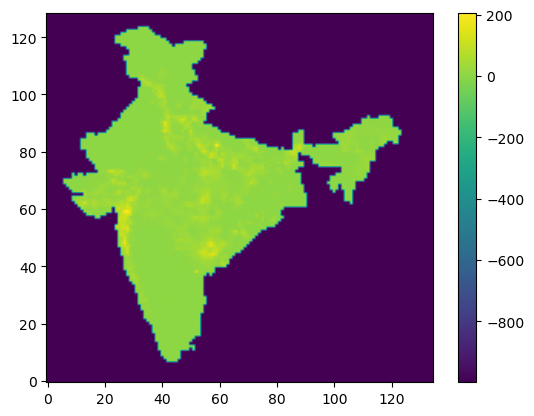

In [113]:
plt.imshow(data, origin='lower')
plt.colorbar()

In [114]:
del ds

## Raster Data Processing

In [ ]:
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np
#from pathlib import Path
import os
from osgeo import osr
import math


#  Mosaicing Images

A mosaic is a combination or merge of two or more images.

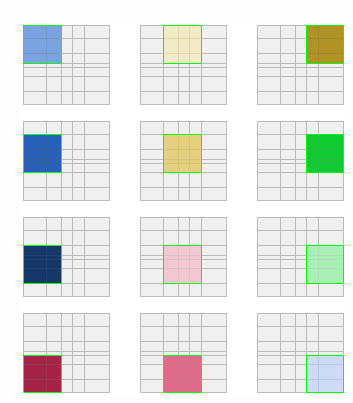

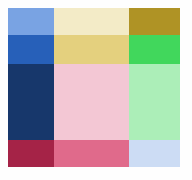

# Mosaicing Images

A mosaic is a combination or merge of two or more images.

In [115]:
base_dir = r'D:\WgCAPD\data\mosaic'

In [116]:
os.chdir(base_dir)

In [117]:
file_names = ['L3-NH44G04-096-050-06Jun14-BAND3.tif',
              'L3-NH44G08-097-050-18May14-BAND3.tif',
              'L3-NH44M01-096-050-06Jun14-BAND3.tif', 
              'L3-NH44M05-097-050-18May14-BAND3.tif']

In [118]:
ds_list = list()
for file in file_names:
    dss = gdal.Open(file)
    ds_list.append(dss)

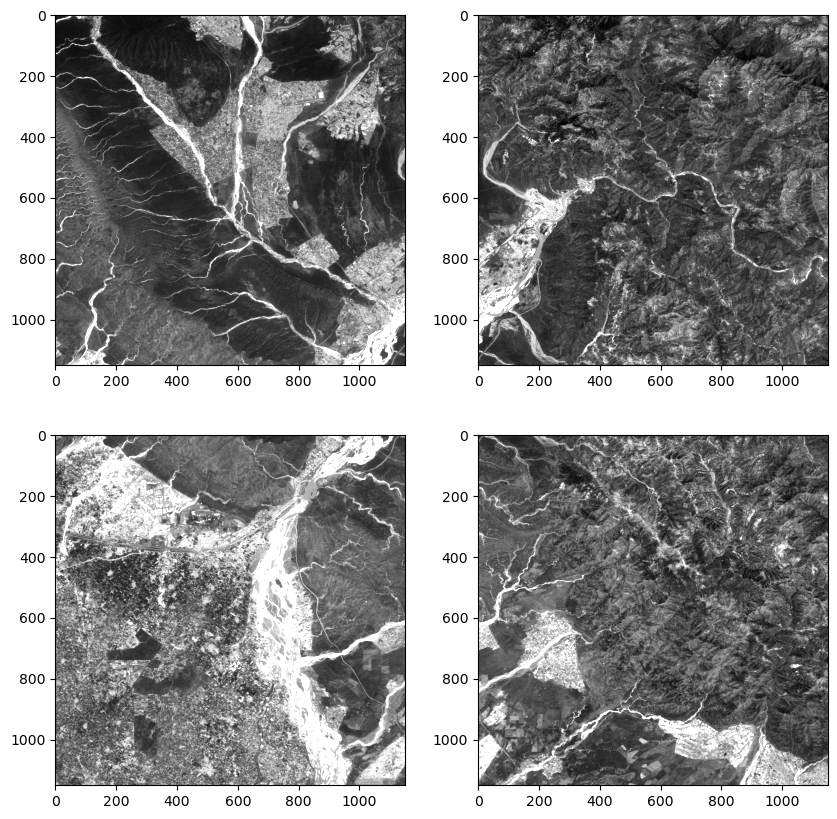

In [119]:
plt.figure(figsize=(10,10))
for i in range(1,len(ds_list)+1):
    plt.subplot(2,2,i)
    plt.imshow(ds_list[i-1].ReadAsArray(),cmap='gray',clim=(50,150),)

In [120]:
dst_ds = gdal.Warp('mosaic_image.tif', file_names,format='GTiff')

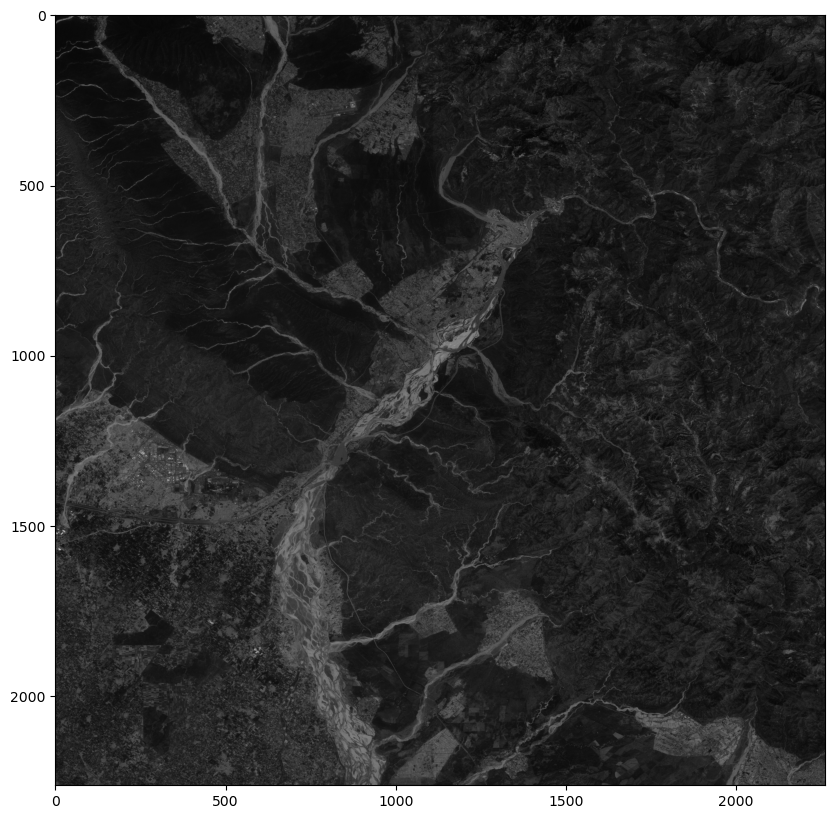

In [122]:
plt.figure(figsize=(10,10))
plt.imshow(dst_ds.ReadAsArray(),cmap='gray')

# Local analyses on Image

Local analysis hey work on two or more arrays that are the same size, and an algebraic equation is applied to each set of pixel locations.
One common task using multispectral imagery is to compute various indices for tasks such as distinguishing between burned and unburned land or measuring nitrogen contained in vegetation.Let’s look at an index used to measure “greenness,” the normalized difference vegetation index (NDVI). The NDVI is a simple index that uses red and near-infrared wavelengths to produce a number that ranges from -1 to 1. Growing plants use red wavelengths for photosynthesis, but reflect near-infrared radiation, so a high ratio of these two measurements can indicate photosynthetic activity and healthy vegetation.

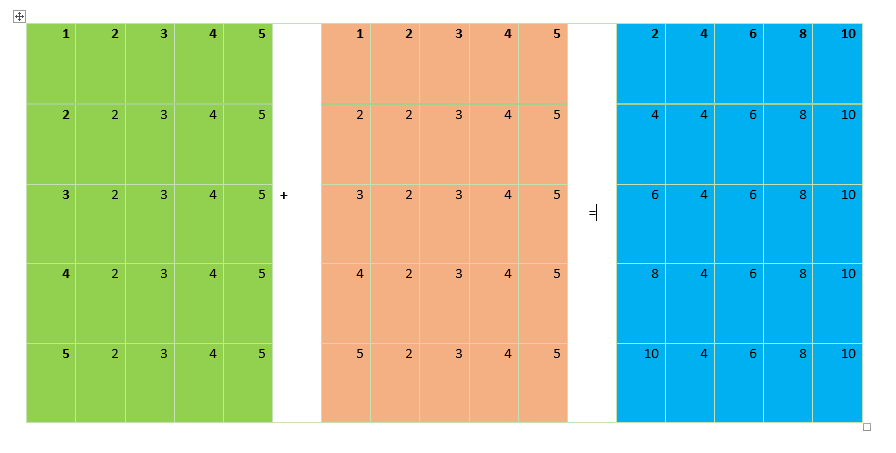

# NDVI from Image

# NDVI=NIR-RED/NIR+RED

In [125]:
from pathlib import Path

In [133]:
base_dir = Path(r'D:\WgCAPD\data\Haridwar')

In [134]:
os.chdir(base_dir)

In [135]:
green_image = 'L3-NH44M01-096-050-06Jun14-BAND2.tif'
red_image = 'L3-NH44M01-096-050-06Jun14-BAND3.tif'
nir_image = 'L3-NH44M01-096-050-06Jun14-BAND4.tif'
swir_image = 'L3-NH44M01-096-050-06Jun14-BAND5.tif'

In [136]:
red_ds = gdal.Open(red_image)

In [137]:
nir_ds = gdal.Open(nir_image)

In [138]:
red_band = red_ds.GetRasterBand(1)
print(gdal.GetDataTypeName(red_band.DataType))


UInt16


In [139]:
nir_band = nir_ds.GetRasterBand(1)
print(gdal.GetDataTypeName(nir_band.DataType))

UInt16


In [140]:
red = red_band.ReadAsArray().astype(np.int32)
nir = nir_band.ReadAsArray().astype(np.int32)

In [141]:
ndvi = (nir - red) / (nir + red)

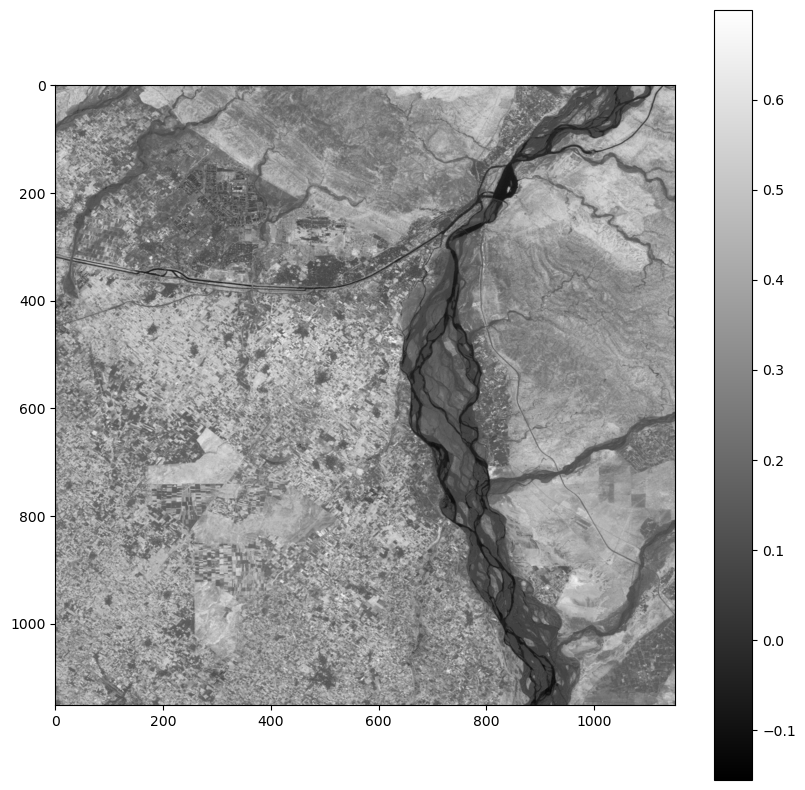

In [142]:
plt.figure(figsize=(10,10))
plt.imshow(ndvi,cmap='gray')
plt.colorbar()

# NDWI Calculation


# NDWI= GREEN-NIR/GREEN+NIR

In [143]:
green = gdal.Open(green_image).ReadAsArray().astype(np.int32)
nir = gdal.Open(nir_image).ReadAsArray().astype(np.int32)

In [148]:
ndwi = (green - nir) / (green + nir)

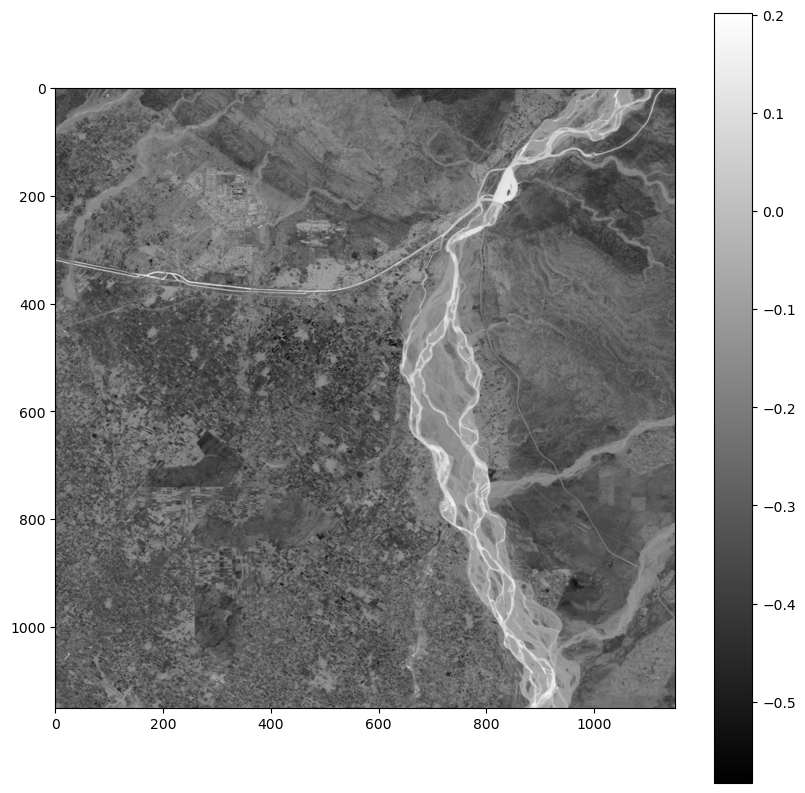

In [149]:
plt.figure(figsize=(10,10))
plt.imshow(ndwi,cmap='gray')
plt.colorbar()

In [150]:
ndwi = np.where(ndwi>0.01, ndwi, 0)

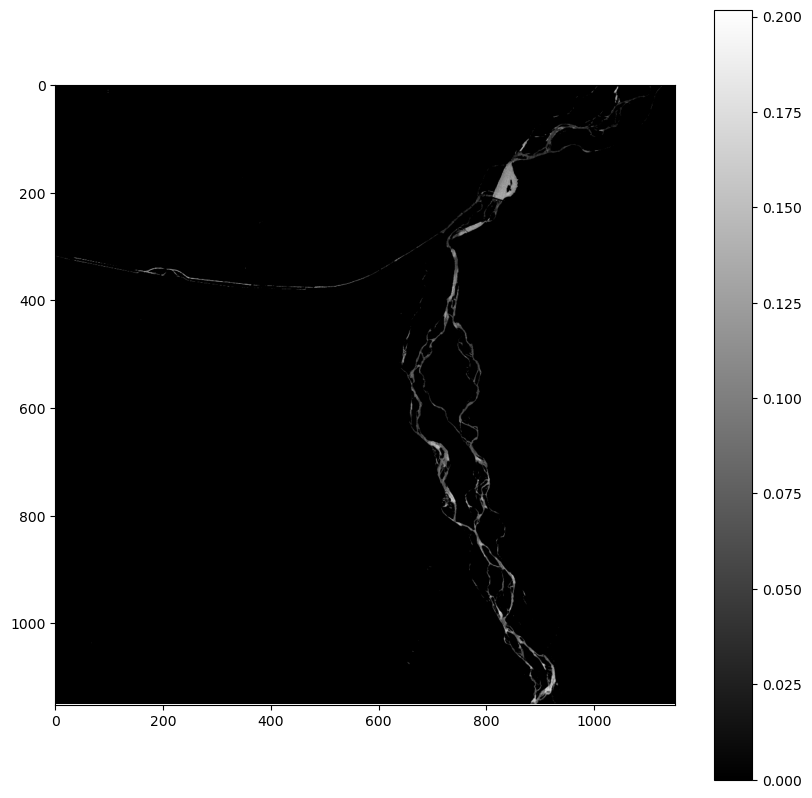

In [151]:
plt.figure(figsize=(10,10))
plt.imshow(ndwi,cmap='gray')
plt.colorbar()

In [152]:
del green
del nir

## Normalized Difference Built-up Index (NDBI)


NDBI is useful for measuring the presence of urban buildings.  It can be calculated using the Short-wave Infrared (SWIR) and Near Infrared (NIR) bands using the formula below, resulting in a value between [-1, 1] where low NDBI values represents no urban land and high NDBI values represents urban land

# NDBI= SWIR-NIR/SWIR+NIR

In [153]:
swir = gdal.Open(swir_image).ReadAsArray().astype(np.int32)
nir = gdal.Open(nir_image).ReadAsArray().astype(np.int32)

In [154]:
ndbi = (swir - nir) / (swir + nir)

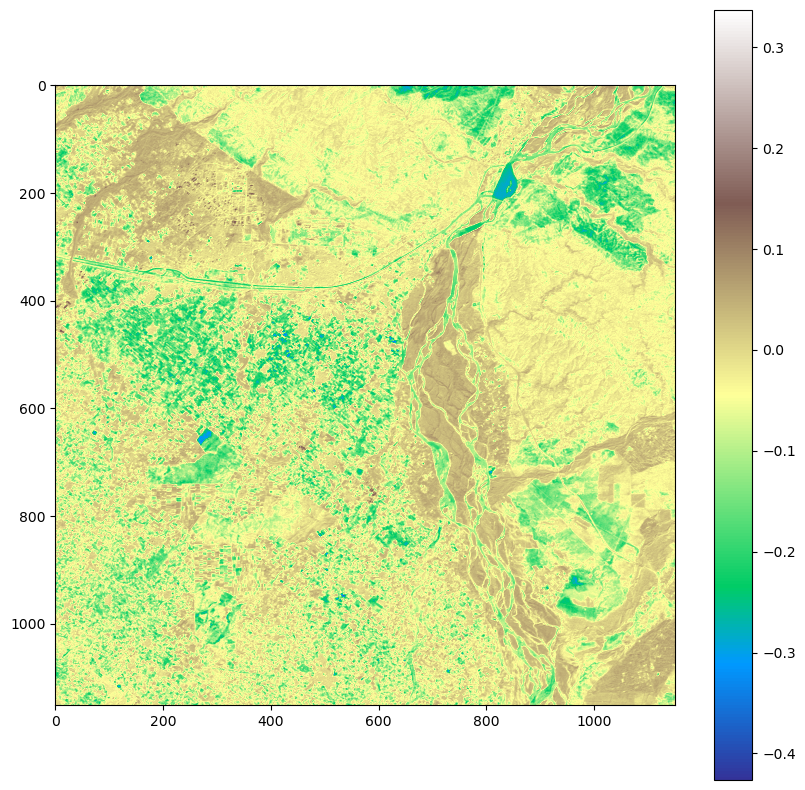

In [155]:
plt.figure(figsize=(10,10))
plt.imshow(ndbi,cmap='terrain')
plt.colorbar()

In [157]:
plt.close()

# Thank You